### GPU Tests...

In [3]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

# Generate some sample data
np.random.seed(0)
X_train = np.random.rand(100, 1) * 10
y_train = 3 * X_train**2 + 2 * X_train + 1 + np.random.randn(100, 1)

# Convert data to PyTorch tensors and move to GPU
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).cuda()
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).cuda()

# Adding polynomial features
degree = 2
X_train_poly = torch.cat([X_train_tensor**i for i in range(1, degree + 1)], dim=1)

# Define polynomial regression model
class PolynomialRegression(nn.Module):
    def __init__(self, input_dim):
        super(PolynomialRegression, self).__init__()
        self.fc = nn.Linear(input_dim, 1)

    def forward(self, x):
        return self.fc(x)

# Instantiate the model and move it to GPU
input_dim = degree
model = PolynomialRegression(input_dim).cuda()

# Define loss function (mean squared error)
criterion = nn.MSELoss()

# Define optimizer
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Training loop
epochs = 1000
for epoch in range(epochs):
    # Forward pass
    outputs = model(X_train_poly)

    # Compute loss
    loss = criterion(outputs, y_train_tensor)

    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if epoch % 100 == 0:
        print(f"Epoch {epoch+1}: Loss = {loss.item()}")

# Print trained parameters
print("Trained parameters:")
for name, param in model.named_parameters():
    print(name, param.data)


Epoch 1: Loss = 17533.69921875
Epoch 101: Loss = 7658.9375
Epoch 201: Loss = 2775.699951171875
Epoch 301: Loss = 811.9129638671875
Epoch 401: Loss = 188.39036560058594
Epoch 501: Loss = 35.514244079589844
Epoch 601: Loss = 6.788653373718262
Epoch 701: Loss = 2.6319050788879395
Epoch 801: Loss = 2.137678384780884
Epoch 901: Loss = 2.0540904998779297
Trained parameters:
fc.weight tensor([[2.1758, 2.9544]], device='cuda:0')
fc.bias tensor([2.4171], device='cuda:0')


In [26]:
import numpy as np
from cuml.preprocessing.model_selection import train_test_split
from cuml.preprocessing import PolynomialFeatures
from cuml.linear_model import LinearRegression

# Generate some sample data
np.random.seed(0)
X = np.random.rand(100, 1) * 10
y = 3 * X**2 + 2 * X + 1 + np.random.randn(100, 1)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Generate polynomial features
degree = 2
poly = PolynomialFeatures(degree=degree)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Train polynomial regression model
model = LinearRegression()
model.fit(X_train_poly, y_train)

# Evaluate model
train_score = model.score(X_train_poly, y_train)
test_score = model.score(X_test_poly, y_test)

print(f"Train R^2 score: {train_score}")
print(f"Test R^2 score: {test_score}")


ModuleNotFoundError: No module named 'cuml'

Epoch 1: Loss = 2638134.5
Epoch 101: Loss = 417.1148986816406
Epoch 201: Loss = 128.93467712402344
Epoch 301: Loss = 122.7293930053711
Epoch 401: Loss = 115.67825317382812
Epoch 501: Loss = 108.0830078125
Epoch 601: Loss = 100.19720458984375
Epoch 701: Loss = 92.2340087890625
Epoch 801: Loss = 84.37364959716797
Epoch 901: Loss = 76.76627349853516


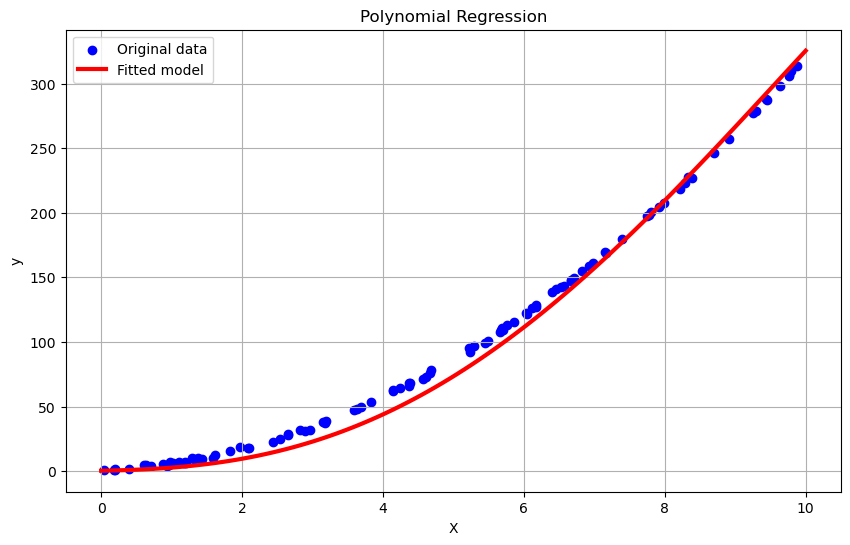

In [25]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

# Generate some sample data
np.random.seed(0)
X = np.random.rand(100, 1) * 10
y = 3 * X**2 + 2 * X + 1 + np.random.randn(100, 1)

# Convert data to PyTorch tensors and move to GPU
X_tensor = torch.tensor(X, dtype=torch.float32).cuda()
y_tensor = torch.tensor(y, dtype=torch.float32).cuda()

# Adding polynomial features
degree = 4
X_poly = torch.cat([X_tensor**i for i in range(1, degree + 1)], dim=1)

# Define polynomial regression model
class PolynomialRegression(nn.Module):
    def __init__(self, input_dim):
        super(PolynomialRegression, self).__init__()
        self.fc = nn.Linear(input_dim, 1)

    def forward(self, x):
        return self.fc(x)

# Instantiate the model and move it to GPU
input_dim = degree
model = PolynomialRegression(input_dim).cuda()

# Define loss function (mean squared error)
criterion = nn.MSELoss()

# Define optimizer
optimizer = optim.Adam(model.parameters(), lr=0.01)

# Training loop
epochs = 1000
for epoch in range(epochs):
    # Forward pass
    outputs = model(X_poly)

    # Compute loss
    loss = criterion(outputs, y_tensor)

    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if epoch % 100 == 0:
        print(f"Epoch {epoch+1}: Loss = {loss.item()}")

# Plot the fitted curve
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='blue', label='Original data')
with torch.no_grad():
    X_plot = torch.linspace(0, 10, 100).reshape(-1, 1).cuda()
    X_plot_poly = torch.cat([X_plot**i for i in range(1, degree + 1)], dim=1)
    plt.plot(X_plot.cpu().numpy(), model(X_plot_poly).cpu().numpy(), color='red', linewidth=3, label='Fitted model')
plt.xlabel('X')
plt.ylabel('y')
plt.title('Polynomial Regression')
plt.legend()
plt.grid(True)
plt.show()


### RE-IMPLEMENTATION (imports, required variables, mother function)

In [3]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
import warnings

warnings.filterwarnings("ignore")
df_student_data = pd.read_csv("student_data.csv")
df_empty = df_student_data
df_student_data['horizontal_distance'] = (df_student_data['x']**2 + df_student_data['y']**2)**0.5
df_empty = df_empty[df_empty['horizontal_distance'].isna()]
df_student_skeleton = pd.read_csv("student_skeleton.csv")
skeleton_sessionid_list = list(df_student_skeleton['sessionId'])
empty_sessionid_list = list(df_empty['sessionId'])

In [4]:
def predict_data(session_id, attribute_name):
    # plt.figure(figsize=(19, 3))  
    # 将timestamp的单位从毫秒转换为秒
    df_attribute = df_student_data.dropna(subset=[attribute_name])
    df_attribute['timestamp'] = df_attribute['timestamp'] / 1000

    session_data = df_attribute[df_attribute['sessionId'] == session_id]

    # 将数据切割成多个小段
    chunk_size = 30 # 设置每段数据的大小

    chunks = [session_data[i:i+chunk_size+1] for i in range(0, len(session_data), chunk_size)]

    df_session_id = df_empty[df_empty['sessionId'] == session_id]
    df_session_id['timestamp'] = df_session_id['timestamp'] / 1000
    df_session_id = df_session_id.reset_index(drop=True)

    prediction_list = []
    counter = 0
    ct = 0

    for chunk in chunks:
        # if counter == 500:    #Tester
        #     break
        # plt.scatter(chunk['timestamp'], chunk[attribute_name], color='blue',s=2)
        
        X = chunk['timestamp'].values.reshape(-1, 1)
        y = chunk[attribute_name].values.reshape(-1, 1)

        counter += 1
        if counter != len(chunks):
            try:
                if counter % 500 == 0:
                    print('—————————————— Now Working on Chunk No.{}/{} ...——————————————'.format(counter,len(chunks)))
                X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
                
                polynomial_features= PolynomialFeatures(degree=2)
                X_train_poly = polynomial_features.fit_transform(X_train)
                # X_test_poly = polynomial_features.transform(X_test)
                
                model = LinearRegression()
                model.fit(X_train_poly, y_train)

                for j in list(df_session_id['timestamp'][ct:]):
                    # print(df_session_id['timestamp'])
                    # print(chunk['timestamp'].min(),chunk['timestamp'].max())
                    if chunk['timestamp'].min() <= j < chunk['timestamp'].max():
                        # print(j)
                        attribute_poly = polynomial_features.transform(df_session_id['timestamp'][ct].reshape(-1,1))
                        predicted_attribute = model.predict(attribute_poly)
                        prediction_list.append(predicted_attribute)
                        ct += 1
# NEEDS DEBBUGING WHERE NOT EQUAL !!! #
                        # plt.axvline(x = df_session_id['timestamp'][ct], color = 'black', linestyle = '--') 
                        # plt.scatter(df_session_id['timestamp'][ct], predicted_attribute, color='green', s=50)
                    else:
                        if ct > 1:
                            break
                        else:
                            ct += 1

                # 生成拟合线
                x_range = np.linspace(chunk['timestamp'].min(), chunk['timestamp'].max(), 100)
                x_range_poly = polynomial_features.transform(x_range.reshape(-1, 1))
                y_pred = model.predict(x_range_poly)
                
                # plt.plot(x_range, y_pred, color='red',linewidth=0.5)
            except:
                print('—————————————— Chunk No.{}/{} too small and skipped! ——————————————'.format(counter,len(chunks)))
                # ct = 0
                for j in list(df_session_id['timestamp'][ct:]):
                    # print(j)
                    if chunk['timestamp'].min() <= j < chunk['timestamp'].max():
                        attribute_poly = polynomial_features.transform(df_session_id['timestamp'][ct].reshape(-1,1))
                        predicted_attribute = model.predict(attribute_poly)
                        prediction_list.append(predicted_attribute)
                        ct += 1
                        # print(prediction_list)
                        # plt.axvline(x = df_session_1['timestamp'][ct], color = 'black', linestyle = '--') 
                        # plt.scatter(df_session_1['timestamp'][ct], predicted_attribute, color='green', s=50)
                    else:
                        break
    # plt.xlabel('Timestamp (seconds)')
    # plt.ylabel('Horizontal Distance')
    # plt.title('Polynomial Regression between Timestamp and ' + attribute_name)
    # plt.legend()
    # plt.show()
    if len(prediction_list) != empty_sessionid_list.count(session_id):
        print('—————————————— NOT EQUAL! ——————————————')
        print(len(prediction_list),empty_sessionid_list.count(session_id))
        gap = empty_sessionid_list.count(session_id) - len(prediction_list)
        for gap_i in range(gap):
            target = len(df_session_id['timestamp']) - gap_i - 1
            attribute_poly = polynomial_features.transform(df_session_id['timestamp'][target].reshape(-1,1))
            predicted_attribute = model.predict(attribute_poly)
            prediction_list.append(predicted_attribute)            
    return prediction_list

### Fitting hor_dist

In [5]:
super_list = []
ct = 0
skeleton_sessionid_set = list(set(df_empty['sessionId']))
for i in skeleton_sessionid_set:
# i = 26
    print('\n++++++++++++ NOW RUNNING SESSION'+str(i)+'!!! ++++++++++++\n')
    super_list.append(predict_data(i,'horizontal_distance'))
    print('Current Session: '+str(i)+'; Session Length = '+str(len(super_list[ct])))
    ct += 1


++++++++++++ NOW RUNNING SESSION1!!! ++++++++++++

—————————————— Now Working on Chunk No.500/6653 ...——————————————
—————————————— Now Working on Chunk No.1000/6653 ...——————————————
—————————————— Now Working on Chunk No.1500/6653 ...——————————————
—————————————— Now Working on Chunk No.2000/6653 ...——————————————
—————————————— Now Working on Chunk No.2500/6653 ...——————————————
—————————————— Now Working on Chunk No.3000/6653 ...——————————————
—————————————— Now Working on Chunk No.3500/6653 ...——————————————
—————————————— Now Working on Chunk No.4000/6653 ...——————————————
—————————————— Now Working on Chunk No.4500/6653 ...——————————————
—————————————— Now Working on Chunk No.5000/6653 ...——————————————
—————————————— Now Working on Chunk No.5500/6653 ...——————————————
—————————————— Now Working on Chunk No.6000/6653 ...——————————————
—————————————— Now Working on Chunk No.6500/6653 ...——————————————
—————————————— NOT EQUAL! ——————————————
7823 7824
Current Session: 1; Session

In [7]:
# testing results
add = 0
for i in range(len(super_list)):
    add += len(super_list[i])
print('Real & expected elements:',add, len(df_empty))
super_list[0][7823],super_list[1][3731],super_list[7][4797]

Real & expected elements: 338892 338892


(array([[3073.40170288]]), array([[1104.36399007]]), array([[4151.66546154]]))

In [8]:
# saved outputs
# super_list_saved
SL_saved_hordist = super_list
SL_saved_hordist

[[array([[703.27462445]]),
  array([[767.39435781]]),
  array([[773.23159334]]),
  array([[785.22870489]]),
  array([[809.50491359]]),
  array([[828.06198428]]),
  array([[781.27607402]]),
  array([[762.68113768]]),
  array([[810.04552742]]),
  array([[837.75062441]]),
  array([[782.15259751]]),
  array([[768.38730577]]),
  array([[748.24990973]]),
  array([[798.37087405]]),
  array([[957.73149772]]),
  array([[868.79002306]]),
  array([[860.44352558]]),
  array([[926.2079417]]),
  array([[769.97937211]]),
  array([[900.541256]]),
  array([[928.64172347]]),
  array([[1124.45846251]]),
  array([[3850.04513468]]),
  array([[4266.49756304]]),
  array([[4244.07851937]]),
  array([[4249.39485471]]),
  array([[4257.01476411]]),
  array([[4259.94200013]]),
  array([[4732.46900689]]),
  array([[2737.3646433]]),
  array([[4321.24591421]]),
  array([[5170.65006238]]),
  array([[4705.32502622]]),
  array([[3934.90704725]]),
  array([[3736.01632516]]),
  array([[3611.16316715]]),
  array([[3680.27

In [9]:
# to nested list
for i in range(len(super_list)):
    for j in range(len(super_list[i])):
        super_list[i][j] = super_list[i][j][0,0]

# to list
super_list = [item for sublist in super_list for item in (sublist if isinstance(sublist, list) else [sublist])]
print('Converted to List, Max =',max(super_list),'Min =',min(super_list))

# save to dataframe df_empty
df_empty["horizontal_distance"] = super_list
df_empty

Converted to List, Max = 14381.930541992188 Min = -1558.592619895935


,sessionId,timestamp,x,y,z,ppgValue,hr,hrIbi,hrStatus,ibiStatus,notification,engagement,affect,context,horizontal_distance
16,1,611,NaN,NaN,NaN,NaN,90.0,691.0,1.0,0.0,NaN,NaN,NaN,NaN,703.274624
41,1,1611,NaN,NaN,NaN,NaN,90.0,676.0,1.0,0.0,NaN,NaN,NaN,NaN,767.394358
67,1,2612,NaN,NaN,NaN,NaN,89.0,665.0,1.0,0.0,NaN,NaN,NaN,NaN,773.231593
93,1,3613,NaN,NaN,NaN,NaN,89.0,689.0,1.0,0.0,NaN,NaN,NaN,NaN,785.228705
120,1,4618,NaN,NaN,NaN,NaN,89.0,689.0,1.0,0.0,NaN,NaN,NaN,NaN,809.504914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8824569,48,4221416,NaN,NaN,NaN,NaN,0.0,404.0,-10.0,0.0,NaN,NaN,NaN,NaN,590.163904
8824595,48,4222416,NaN,NaN,NaN,NaN,0.0,213.0,-10.0,0.0,NaN,NaN,NaN,NaN,681.887058
8824621,48,4223419,NaN,NaN,NaN,NaN,0.0,478.0,-10.0,0.0,NaN,NaN,NaN,NaN,1097.051483
8824647,48,4224422,NaN,NaN,NaN,NaN,0.0,0.0,-10.0,0.0,NaN,NaN,NaN,NaN,268.994278


### Fitting Z

In [ ]:
super_list = []
ct = 0
skeleton_sessionid_set = list(set(df_empty['sessionId']))
for i in skeleton_sessionid_set:
# i = 26
    print('\n++++++++++++ NOW RUNNING SESSION'+str(i)+'!!! ++++++++++++\n')
    super_list.append(predict_data(i,'z'))
    print('Current Session: '+str(i)+'; Session Length = '+str(len(super_list[ct])))
    ct += 1


++++++++++++ NOW RUNNING SESSION1!!! ++++++++++++

—————————————— Now Working on Chunk No.500/6653 ...——————————————
—————————————— Now Working on Chunk No.1000/6653 ...——————————————
—————————————— Now Working on Chunk No.1500/6653 ...——————————————
—————————————— Now Working on Chunk No.2000/6653 ...——————————————
—————————————— Now Working on Chunk No.2500/6653 ...——————————————
—————————————— Now Working on Chunk No.3000/6653 ...——————————————
—————————————— Now Working on Chunk No.3500/6653 ...——————————————
—————————————— Now Working on Chunk No.4000/6653 ...——————————————
—————————————— Now Working on Chunk No.4500/6653 ...——————————————
—————————————— Now Working on Chunk No.5000/6653 ...——————————————
—————————————— Now Working on Chunk No.5500/6653 ...——————————————
—————————————— Now Working on Chunk No.6000/6653 ...——————————————
—————————————— Now Working on Chunk No.6500/6653 ...——————————————
—————————————— NOT EQUAL! ——————————————
7823 7824
Current Session: 1; Session

In [ ]:
SL_saved = super_list
SL_saved

[[array([[4098.37800406]]),
  array([[4116.52682014]]),
  array([[4134.10628267]]),
  array([[4100.4410736]]),
  array([[4095.18976955]]),
  array([[4072.14455717]]),
  array([[4102.14938609]]),
  array([[4095.73350921]]),
  array([[4221.22326638]]),
  array([[4081.07904122]]),
  array([[4113.33697543]]),
  array([[4116.90997566]]),
  array([[4094.92298939]]),
  array([[4080.74305956]]),
  array([[4120.8157707]]),
  array([[4090.35068701]]),
  array([[4095.32546243]]),
  array([[4124.72588608]]),
  array([[4066.26939515]]),
  array([[4054.15795175]]),
  array([[4074.46404365]]),
  array([[3935.71229717]]),
  array([[2149.01929602]]),
  array([[385.26217641]]),
  array([[456.62155247]]),
  array([[479.69565679]]),
  array([[552.9201612]]),
  array([[555.82370427]]),
  array([[851.39044668]]),
  array([[2731.90651731]]),
  array([[104.69848361]]),
  array([[1101.23696696]]),
  array([[-422.48801175]]),
  array([[-1778.33117182]]),
  array([[-2104.16978591]]),
  array([[-2241.30245307]]),

In [ ]:
# get rid of arrays
for i in range(len(super_list)):
    for j in range(len(super_list[i])):
        super_list[i][j] = super_list[i][j][0,0]
print(super_list)

# tolist & todataframe
super_list = [item for sublist in super_list for item in (sublist if isinstance(sublist, list) else [sublist])]
df_empty["z"] = super_list

[[4098.378004062961, 4116.5268201428635, 4134.106282669812, 4100.441073601103, 4095.189769548691, 4072.144557173506, 4102.149386092071, 4095.73350920648, 4221.223266381891, 4081.079041221159, 4113.3369754325695, 4116.909975661816, 4094.922989393772, 4080.7430595600217, 4120.815770704276, 4090.350687009299, 4095.3254624260826, 4124.725886077511, 4066.2693951454985, 4054.1579517506257, 4074.464043652635, 3935.7122971733334, 2149.0192960174754, 385.26217641278345, 456.6215524678555, 479.69565679064544, 552.9201611953667, 555.8237042737928, 851.390446679201, 2731.9065173082054, 104.69848360662581, 1101.236966961529, -422.48801174829714, -1778.3311718222685, -2104.169785907725, -2241.3024530698312, -2113.4238723948365, -2024.6333927283995, -480.12118886597455, -223.2196142571047, -290.300572415581, 368.1830495634349, 730.0118571482599, -6.822740497067571, -191.91864752210677, 2448.9070302546024, 3387.387665245682, 3647.8155180150643, 762.3992960974574, 92.58577271504328, 484.16859721858054,

In [ ]:
df_empty

,sessionId,timestamp,x,y,z,ppgValue,hr,hrIbi,hrStatus,ibiStatus,notification,engagement,affect,context,horizontal_distance
16,1,611,NaN,NaN,4098.378004,NaN,90.0,691.0,1.0,0.0,NaN,NaN,NaN,NaN,703.274624
41,1,1611,NaN,NaN,4116.526820,NaN,90.0,676.0,1.0,0.0,NaN,NaN,NaN,NaN,767.394358
67,1,2612,NaN,NaN,4134.106283,NaN,89.0,665.0,1.0,0.0,NaN,NaN,NaN,NaN,773.231593
93,1,3613,NaN,NaN,4100.441074,NaN,89.0,689.0,1.0,0.0,NaN,NaN,NaN,NaN,785.228705
120,1,4618,NaN,NaN,4095.189770,NaN,89.0,689.0,1.0,0.0,NaN,NaN,NaN,NaN,809.504914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8824569,48,4221416,NaN,NaN,4024.603533,NaN,0.0,404.0,-10.0,0.0,NaN,NaN,NaN,NaN,590.163904
8824595,48,4222416,NaN,NaN,3972.600156,NaN,0.0,213.0,-10.0,0.0,NaN,NaN,NaN,NaN,681.887058
8824621,48,4223419,NaN,NaN,3882.920830,NaN,0.0,478.0,-10.0,0.0,NaN,NaN,NaN,NaN,1097.051483
8824647,48,4224422,NaN,NaN,4123.242774,NaN,0.0,0.0,-10.0,0.0,NaN,NaN,NaN,NaN,268.994278


### Fitting ppgValue

In [ ]:
super_list = []
ct = 0
skeleton_sessionid_set = list(set(df_empty['sessionId']))
for i in skeleton_sessionid_set:
# i = 26
    print('\n++++++++++++ NOW RUNNING SESSION'+str(i)+'!!! ++++++++++++\n')
    super_list.append(predict_data(i,'ppgValue'))
    print('Current Session: '+str(i)+'; Session Length = '+str(len(super_list[ct])))
    ct += 1


++++++++++++ NOW RUNNING SESSION1!!! ++++++++++++

—————————————— Now Working on Chunk No.500/6653 ...——————————————
—————————————— Now Working on Chunk No.1000/6653 ...——————————————
—————————————— Now Working on Chunk No.1500/6653 ...——————————————
—————————————— Now Working on Chunk No.2000/6653 ...——————————————
—————————————— Now Working on Chunk No.2500/6653 ...——————————————
—————————————— Now Working on Chunk No.3000/6653 ...——————————————
—————————————— Now Working on Chunk No.3500/6653 ...——————————————
—————————————— Now Working on Chunk No.4000/6653 ...——————————————
—————————————— Now Working on Chunk No.4500/6653 ...——————————————
—————————————— Now Working on Chunk No.5000/6653 ...——————————————
—————————————— Now Working on Chunk No.5500/6653 ...——————————————
—————————————— Now Working on Chunk No.6000/6653 ...——————————————
—————————————— Now Working on Chunk No.6500/6653 ...——————————————
—————————————— NOT EQUAL! ——————————————
7823 7824
Current Session: 1; Session

In [ ]:
SL_saved_ppg = super_list
SL_saved_ppg

[[array([[1918891.01749362]]),
  array([[1923186.62987101]]),
  array([[1921378.29084687]]),
  array([[1920493.64925301]]),
  array([[1919676.66514541]]),
  array([[1918656.83162535]]),
  array([[1913827.46640221]]),
  array([[1906047.85862763]]),
  array([[1901405.95894065]]),
  array([[1902326.24458139]]),
  array([[1901240.7485269]]),
  array([[1904416.66040007]]),
  array([[1904929.12166139]]),
  array([[1912306.17950626]]),
  array([[1919582.5519088]]),
  array([[1924997.9297127]]),
  array([[1913219.66238435]]),
  array([[1908408.50888501]]),
  array([[1911692.77686897]]),
  array([[1919816.80780807]]),
  array([[1921558.66409662]]),
  array([[1919951.88175195]]),
  array([[1936901.94722608]]),
  array([[1869526.09208861]]),
  array([[1845628.4214812]]),
  array([[1829865.21624107]]),
  array([[1824096.56914099]]),
  array([[1823108.0439731]]),
  array([[1825120.57673151]]),
  array([[1877946.70614402]]),
  array([[1899214.57095198]]),
  array([[1876956.1997411]]),
  array([[1934

In [ ]:
# get rid of arrays
for i in range(len(super_list)):
    for j in range(len(super_list[i])):
        super_list[i][j] = super_list[i][j][0,0]
print(super_list)

# tolist & todataframe
super_list = [item for sublist in super_list for item in (sublist if isinstance(sublist, list) else [sublist])]
df_empty["ppg"] = super_list
df_empty

[[1918891.0174936228, 1923186.629871008, 1921378.2908468703, 1920493.6492530103, 1919676.6651454133, 1918656.8316253498, 1913827.4664022147, 1906047.8586276327, 1901405.958940651, 1902326.2445813864, 1901240.748526896, 1904416.6604000698, 1904929.1216613944, 1912306.1795062553, 1919582.5519088, 1924997.9297126983, 1913219.6623843508, 1908408.5088850143, 1911692.776868973, 1919816.8078080746, 1921558.6640966204, 1919951.8817519462, 1936901.947226081, 1869526.09208861, 1845628.4214811954, 1829865.2162410682, 1824096.5691409875, 1823108.043973099, 1825120.576731511, 1877946.7061440162, 1899214.5709519796, 1876956.1997410953, 1934349.9966249168, 1955931.7358728647, 1936050.970550531, 1921544.883959338, 1913295.8325494844, 1903785.9908532798, 1935443.6823424846, 1881944.0899135768, 1871224.891074963, 1855510.8111074436, 1846175.7393540926, 1850319.889742936, 1862387.2985001737, 1877919.983799547, 1919972.1514607891, 1937447.203257382, 1946813.2561828345, 1904183.7506688684, 1891926.98415637

,sessionId,timestamp,x,y,z,ppgValue,hr,hrIbi,hrStatus,ibiStatus,notification,engagement,affect,context,horizontal_distance,ppg
16,1,611,NaN,NaN,4098.378004,NaN,90.0,691.0,1.0,0.0,NaN,NaN,NaN,NaN,703.274624,1.918891e+06
41,1,1611,NaN,NaN,4116.526820,NaN,90.0,676.0,1.0,0.0,NaN,NaN,NaN,NaN,767.394358,1.923187e+06
67,1,2612,NaN,NaN,4134.106283,NaN,89.0,665.0,1.0,0.0,NaN,NaN,NaN,NaN,773.231593,1.921378e+06
93,1,3613,NaN,NaN,4100.441074,NaN,89.0,689.0,1.0,0.0,NaN,NaN,NaN,NaN,785.228705,1.920494e+06
120,1,4618,NaN,NaN,4095.189770,NaN,89.0,689.0,1.0,0.0,NaN,NaN,NaN,NaN,809.504914,1.919677e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8824569,48,4221416,NaN,NaN,4024.603533,NaN,0.0,404.0,-10.0,0.0,NaN,NaN,NaN,NaN,590.163904,2.334456e+06
8824595,48,4222416,NaN,NaN,3972.600156,NaN,0.0,213.0,-10.0,0.0,NaN,NaN,NaN,NaN,681.887058,2.092680e+06
8824621,48,4223419,NaN,NaN,3882.920830,NaN,0.0,478.0,-10.0,0.0,NaN,NaN,NaN,NaN,1097.051483,2.096777e+06
8824647,48,4224422,NaN,NaN,4123.242774,NaN,0.0,0.0,-10.0,0.0,NaN,NaN,NaN,NaN,268.994278,2.077879e+06


In [ ]:
# SAVING TO .CSV
df_empty.to_csv('filled_attributes.csv', index=False)

### Performing KNN

In [ ]:
# filter bad data
df_empty = df_empty[df_empty['ibiStatus'] != 1]
df_filtered = df_empty[df_empty['hrStatus'] == 1]
df_filtered

,sessionId,timestamp,x,y,z,ppgValue,hr,hrIbi,hrStatus,ibiStatus,notification,engagement,affect,context,horizontal_distance,ppg
16,1,611,NaN,NaN,4098.378004,NaN,90.0,691.0,1.0,0.0,NaN,NaN,NaN,NaN,703.274624,1.918891e+06
41,1,1611,NaN,NaN,4116.526820,NaN,90.0,676.0,1.0,0.0,NaN,NaN,NaN,NaN,767.394358,1.923187e+06
67,1,2612,NaN,NaN,4134.106283,NaN,89.0,665.0,1.0,0.0,NaN,NaN,NaN,NaN,773.231593,1.921378e+06
93,1,3613,NaN,NaN,4100.441074,NaN,89.0,689.0,1.0,0.0,NaN,NaN,NaN,NaN,785.228705,1.920494e+06
120,1,4618,NaN,NaN,4095.189770,NaN,89.0,689.0,1.0,0.0,NaN,NaN,NaN,NaN,809.504914,1.919677e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8823010,48,4161197,NaN,NaN,1372.878026,NaN,97.0,223.0,1.0,0.0,NaN,NaN,NaN,NaN,3804.677614,1.937585e+06
8823660,48,4186298,NaN,NaN,1369.600339,NaN,93.0,667.0,1.0,0.0,NaN,NaN,NaN,NaN,3801.886039,2.035012e+06
8823788,48,4191303,NaN,NaN,1373.845004,NaN,92.0,446.0,1.0,0.0,NaN,NaN,NaN,NaN,3802.820414,2.031815e+06
8823814,48,4192306,NaN,NaN,1367.995027,NaN,91.0,409.0,1.0,0.0,NaN,NaN,NaN,NaN,3808.997264,2.040254e+06


In [ ]:
# drop unused attributes
columns_to_drop = ['x', 'y', 'ppgValue', 'hrStatus', 'ibiStatus', 'notification', 'engagement','affect','context']
df_dropped = df_filtered.drop(columns=columns_to_drop)
df_dropped

,sessionId,timestamp,z,hr,hrIbi,horizontal_distance,ppg
16,1,611,4098.378004,90.0,691.0,703.274624,1.918891e+06
41,1,1611,4116.526820,90.0,676.0,767.394358,1.923187e+06
67,1,2612,4134.106283,89.0,665.0,773.231593,1.921378e+06
93,1,3613,4100.441074,89.0,689.0,785.228705,1.920494e+06
120,1,4618,4095.189770,89.0,689.0,809.504914,1.919677e+06
...,...,...,...,...,...,...,...
8823010,48,4161197,1372.878026,97.0,223.0,3804.677614,1.937585e+06
8823660,48,4186298,1369.600339,93.0,667.0,3801.886039,2.035012e+06
8823788,48,4191303,1373.845004,92.0,446.0,3802.820414,2.031815e+06
8823814,48,4192306,1367.995027,91.0,409.0,3808.997264,2.040254e+06


In [ ]:
# turn into X
X = df_dropped.values
X

array([[1.00000000e+00, 6.11000000e+02, 4.09837800e+03, ...,
        6.91000000e+02, 7.03274624e+02, 1.91889102e+06],
       [1.00000000e+00, 1.61100000e+03, 4.11652682e+03, ...,
        6.76000000e+02, 7.67394358e+02, 1.92318663e+06],
       [1.00000000e+00, 2.61200000e+03, 4.13410628e+03, ...,
        6.65000000e+02, 7.73231593e+02, 1.92137829e+06],
       ...,
       [4.80000000e+01, 4.19130300e+06, 1.37384500e+03, ...,
        4.46000000e+02, 3.80282041e+03, 2.03181499e+06],
       [4.80000000e+01, 4.19230600e+06, 1.36799503e+03, ...,
        4.09000000e+02, 3.80899726e+03, 2.04025390e+06],
       [4.80000000e+01, 4.19330900e+06, 1.37118796e+03, ...,
        1.24700000e+03, 3.80234398e+03, 2.03519384e+06]])

In [ ]:
import torch
from torch import nn
from torch.nn.functional import pairwise_distance
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Generate sample data
X, y = make_classification(n_samples=8000, n_features=7, n_classes=2, random_state=42)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert data to PyTorch tensors and move to GPU
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).cuda()
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).cuda()
y_train_tensor = torch.tensor(y_train, dtype=torch.long).cuda()

# Define k-nearest neighbors model
class KNN(nn.Module):
    def __init__(self, k):
        super(KNN, self).__init__()
        self.k = k

    def forward(self, x_train, x_test):
        distances = pairwise_distance(x_test.unsqueeze(1), x_train.unsqueeze(0))
        _, indices = distances.topk(self.k, largest=False)
        return indices

# Instantiate the KNN model
k = 5  # Number of neighbors
knn_model = KNN(k).cuda()

# Find nearest neighbors for each test sample
indices = knn_model(X_train_tensor, X_test_tensor)

# Predict labels based on nearest neighbors
y_pred = torch.mode(y_train_tensor[indices], dim=1).values.cpu().numpy()

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.86875
